In [ ]:
#Aluno: Gabriel Pellozi - RGM: 13423118

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [56]:
import os
import numpy as np 
import cv2
import matplotlib.pyplot as plt 
%matplotlib inline

In [ ]:
def mostrar_img(img, titulo = ''):
  plt.axis("off")
  plt.suptitle(titulo)
  plt.imshow(img)
  plt.show()

In [ ]:
def mostrar_img_color(img, titulo = ''):
  plt.axis("off")
  plt.suptitle(titulo)
  plt.imshow(cv2.cvtColor(img, cv2.COLOR_HSV2RGB))
  plt.show()

In [ ]:
def mostrar_img_gray(img, titulo = ''):
  plt.axis("off")
  plt.suptitle(titulo)
  plt.imshow(img, cmap = 'gray')
  plt.show()

In [ ]:
def pegar_img_drive(img):
  return cv2.imread(img)

In [ ]:
def redimensionar_img(imgOriginal, imgFundo):
  altura = imgOriginal.shape[0]
  largura = imgOriginal.shape[1]

  return cv2.resize(imgFundo, (largura, altura))

In [ ]:
def binarizar_alcance_cor(img):
  verde_claro = (50, 100, 100)
  verde_escuro = (70, 255, 255)

  return cv2.threshold(cv2.inRange(img, verde_claro, verde_escuro), 0, 255, cv2.THRESH_BINARY)[1]

In [ ]:
def binarizar_img(img, treshhold):
  img_norm = img.astype(np.float32) / 255

  img_bool = (img_norm > treshhold) * 255
  return np.clip(img_bool, 0, 255).astype(np.uint8)

In [ ]:
def binarizar_img_em_cinza(img, treshhold):
  img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  return binarizar_img(img_gray, treshhold)

In [ ]:
def aplicar_gaussiano(img, gaussian_x, gaussian_y):
  gaussian = (gaussian_x, gaussian_y)
  
  return cv2.GaussianBlur(img, gaussian, 0)

In [ ]:
def aplicar_sobel(img, sobel_x, sobel_y):
  img_sobel_x = cv2.Sobel(img, cv2.CV_64F, 1, 0, sobel_x)
  img_sobel_y = cv2.Sobel(img, cv2.CV_64F, 0, 1, sobel_y)

  return cv2.convertScaleAbs(cv2.addWeighted(img_sobel_x, 0.5, img_sobel_y, 0.5, 0))

In [ ]:
def aplicar_mascara(img, mask):
  return cv2.bitwise_and(img, img, mask = mask)

In [ ]:
def setar_valor_maximo(img):
  img_copia = img.copy()

  for x in range(img_copia.shape[0]):
    for y in range(img_copia.shape[1]):
      if(img_copia[x][y] != 0):
        img_copia[x][y] = 140

  return img_copia

In [62]:
def salvar_img_drive(img, caminho):
  img_copia = img.copy()
  img_copia = cv2.cvtColor(img_copia, cv2.COLOR_HSV2BGR)

  cv2.imwrite(caminho, img_copia)

In [61]:
def salvar_img_drive_gray(img, caminho):
  img_copia = img.copy()
  img_copia = cv2.cvtColor(img_copia, cv2.COLOR_GRAY2BGR)

  cv2.imwrite(caminho, img_copia)

In [77]:
def gerar_img_chroma_key(imgOriginal, imgFundo, valor_gauss_x, valor_gauss_y, valor_sobel_x, valor_sobel_y, sobel_treshhold, erosao_kernel_x, erosao_kernel_y, caminho_trabalho, caminho, imgNome):
  imgOriginal = cv2.cvtColor(imgOriginal, cv2.COLOR_BGR2HSV)
  imgFundo = cv2.cvtColor(imgFundo, cv2.COLOR_BGR2HSV)

  print(f'Aplicando para imagem {imgNome}')

  #Aplicar Resize no Fundo:
  img_fundo_resize = redimensionar_img(imgOriginal, imgFundo)
  mostrar_img_color(img_fundo_resize, 'Fundo Resize')

  #Aplicar Binarização na Imagem
  img_binarizada = binarizar_alcance_cor(imgOriginal)
  mostrar_img_gray(img_binarizada, 'Binarizado')

  #Aplicar Gaussiano na Imagem:
  img_gaussian = aplicar_gaussiano(img_binarizada, valor_gauss_x, valor_gauss_y)
  mostrar_img_gray(img_gaussian, 'Gaussiano')

  #Aplicar Sobel na Imagem:
  img_sobel = aplicar_sobel(img_gaussian, valor_sobel_x, valor_sobel_y)
  mostrar_img_gray(img_sobel, 'Sobel')

  #Aplicar Mascara usando a Imagem Sobel:
  #img_sobel_invert = cv2.bitwise_not(img_sobel)
  #img_sobel_mask = aplicar_mascara(img_binarizada, img_sobel_invert)
  
  #img_sobel_mask = setar_valor_maximo(img_sobel)

  img_sobel_mask = binarizar_img(img_sobel, sobel_treshhold)

  erosao_kernel = np.ones((erosao_kernel_x, erosao_kernel_y), np.uint8)
  #img_sobel_mask = cv2.dilate(img_sobel, kernel, iterations=1)
  #img_sobel_mask = cv2.morphologyEx(img_sobel_mask, cv2.MORPH_CLOSE, kernel)
  img_sobel_mask = cv2.add(img_binarizada, img_sobel_mask)

  if erosao_kernel_x < 0 or erosao_kernel_y < 0:
    img_sobel_mask = cv2.erode(img_sobel_mask, erosao_kernel, iterations=1)

  #img_sobel_mask = binarizar_img(img_sobel, 0)

  #img_sobel_mask = cv2.bitwise_or(img_sobel_mask, img_binarizada)

  mostrar_img_gray(img_sobel_mask, 'Sobel com Mascara')

  #Criar Mascara para o Fundo e a Imagem para Chroma Key:
  img_fundo_mask = aplicar_mascara(img_fundo_resize, img_sobel_mask)
  mostrar_img_color(img_fundo_mask, 'Fundo com Mascara')

  img_original_mask = aplicar_mascara(imgOriginal, cv2.bitwise_not(img_sobel_mask))
  mostrar_img_color(img_original_mask, 'Imagem Com Mascara')

  img_final = cv2.add(img_fundo_mask, img_original_mask)
  mostrar_img_color(img_final, 'Resultado Final')

  #Salvando Imagens no drive:
  if not os.path.exists("drive/MyDrive" + caminho_trabalho):
    os.mkdir("drive/MyDrive" + caminho_trabalho)

  salvar_img_drive_gray(img_binarizada, caminho + '/01-Binarizacao_' + imgNome + '.bmp')
  salvar_img_drive_gray(img_gaussian, caminho + '/02-Gauss_' + imgNome + '.bmp')
  salvar_img_drive_gray(img_sobel, caminho + '/03-Sobel_' + imgNome + '.bmp')
  salvar_img_drive_gray(img_sobel_mask, caminho + '/04-SobelMascara_' + imgNome + '.bmp')
  salvar_img_drive(img_final, caminho + '/05-ResultadoFinal_' + imgNome + '.bmp')

  #return img_final

In [80]:
#Configurações Iniciais
caminho_base = '/content/drive/MyDrive'
caminho_trabalho = '/Faculdade/VisaoComputacional/TrabalhoBimestral'
caminho = caminho_base + caminho_trabalho + '/Imagens'
resultado = caminho_base + caminho_trabalho + '/Resultados'

img_fundo = cv2.imread(caminho + '/background.bmp')

Aplicando para imagem corvo


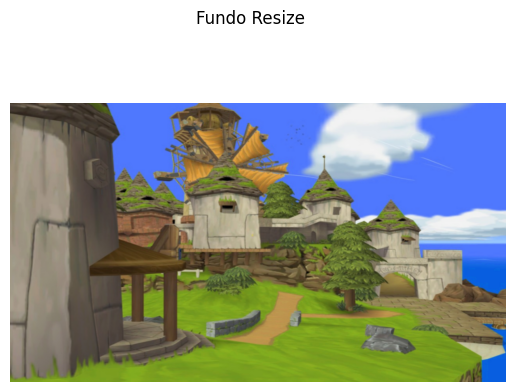

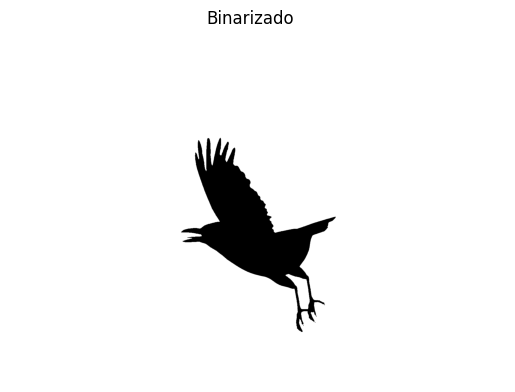

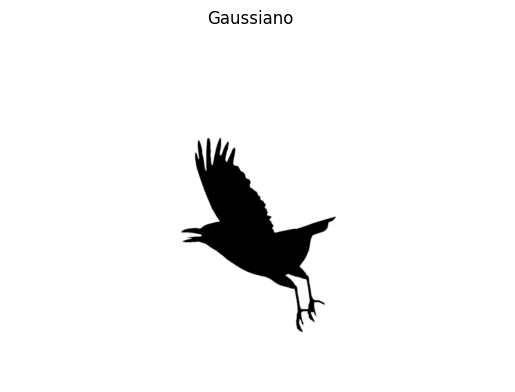

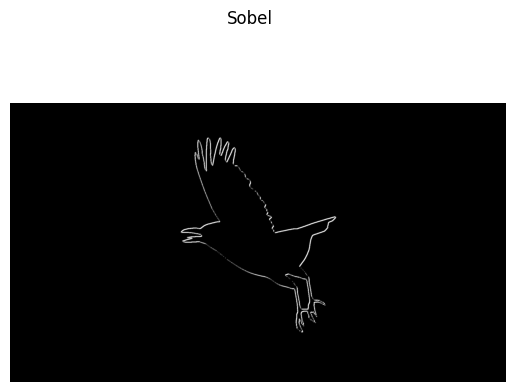

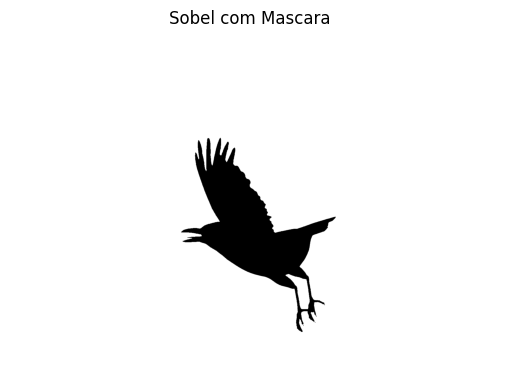

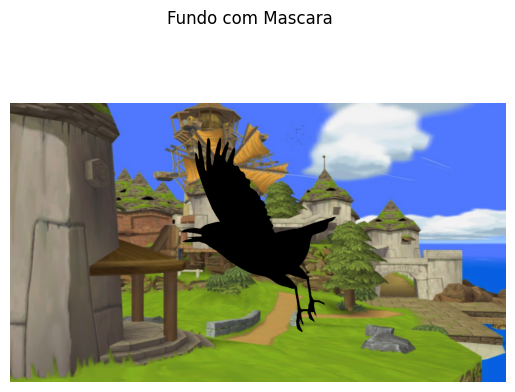

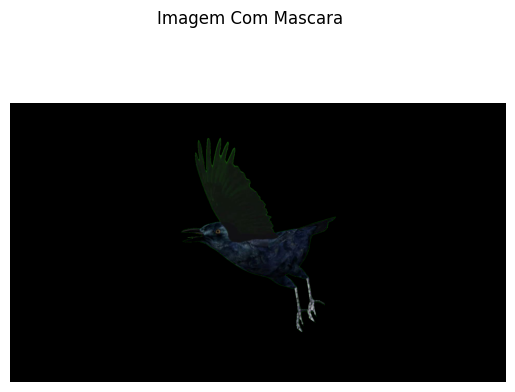

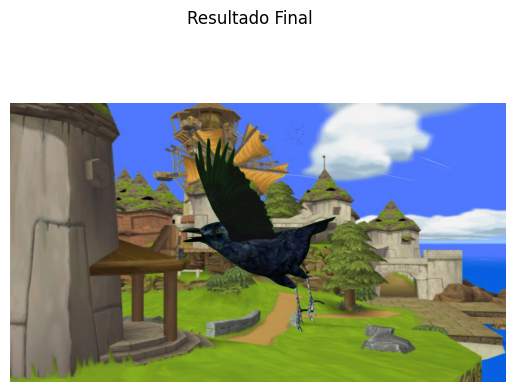

Aplicando para imagem corvo


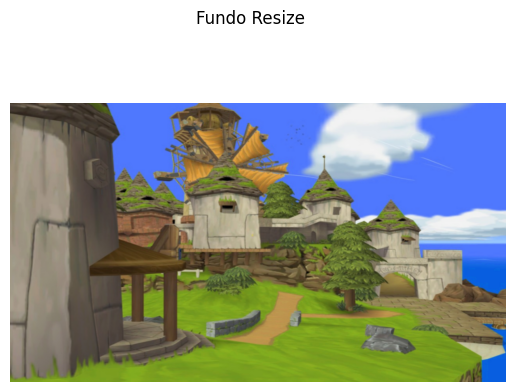

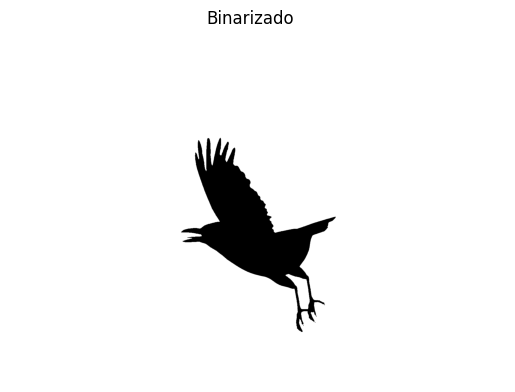

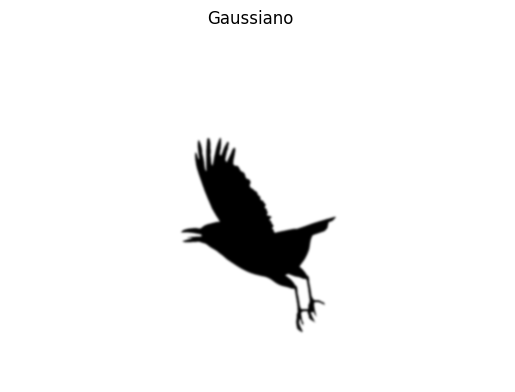

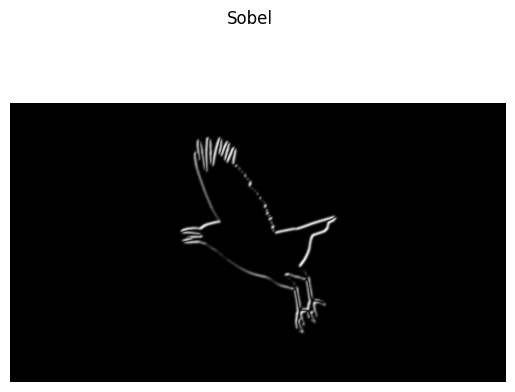

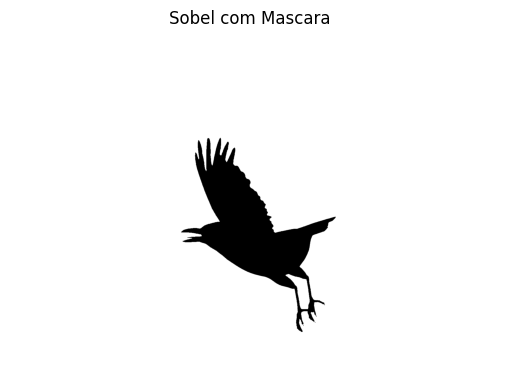

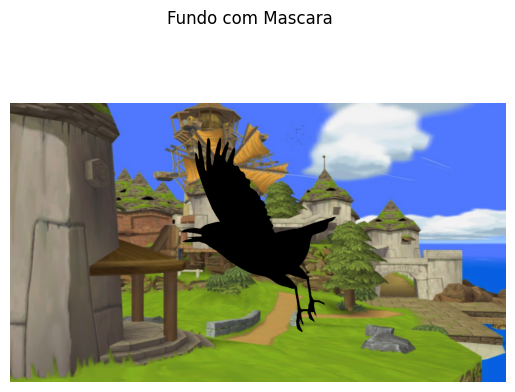

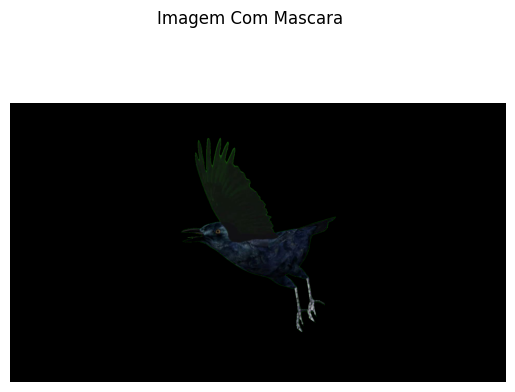

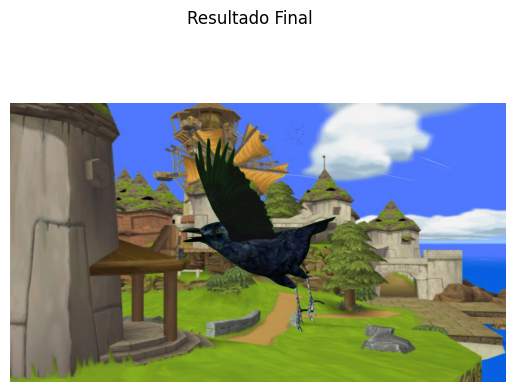

Aplicando para imagem corvo


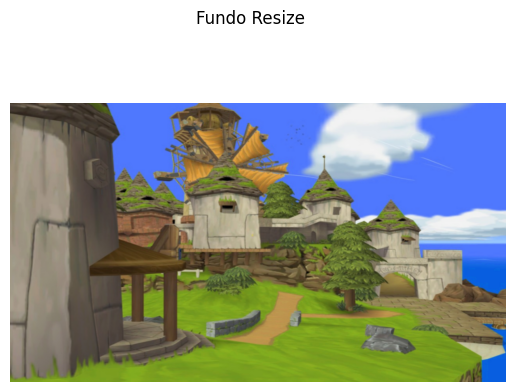

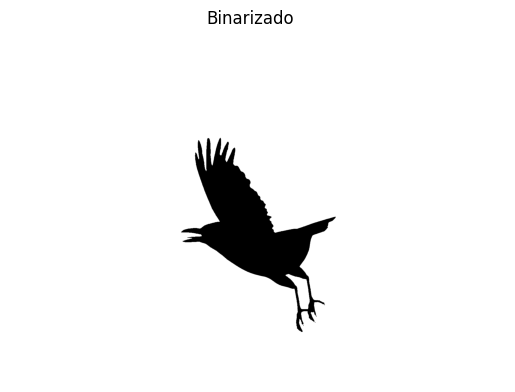

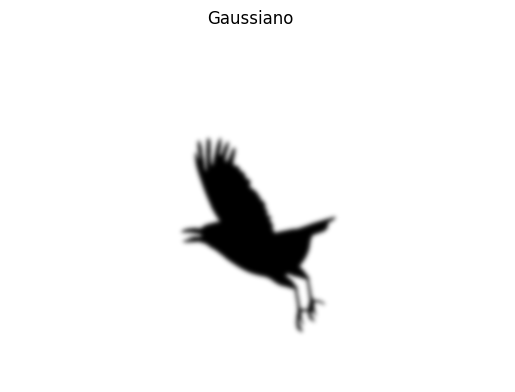

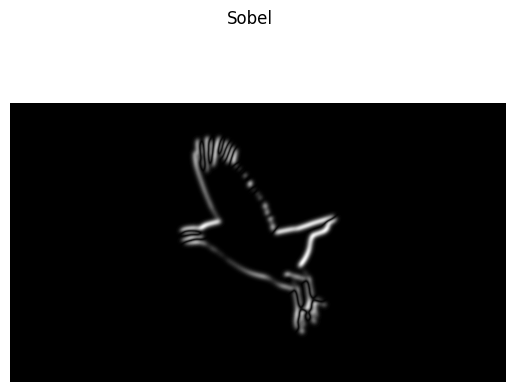

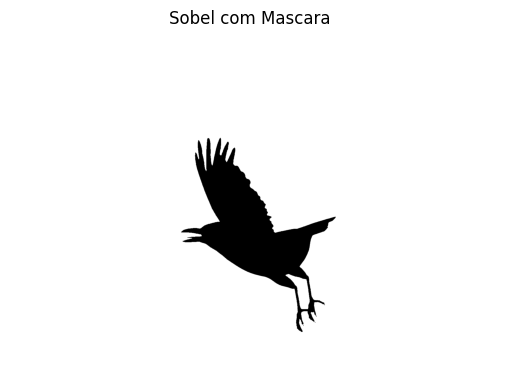

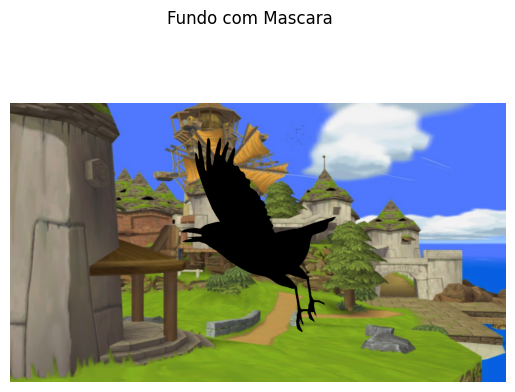

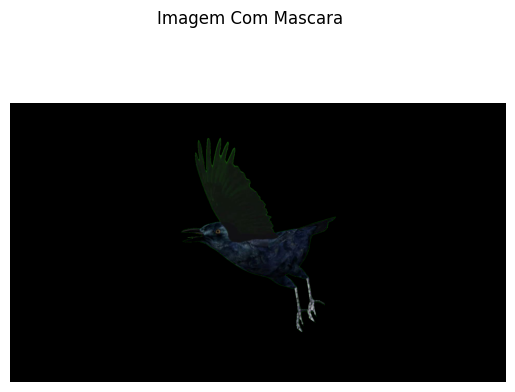

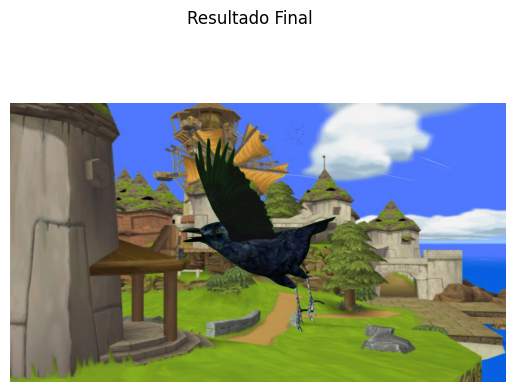

In [81]:
#Aplicando Chroma Key no Corvo
img_corvo = cv2.imread(caminho + '/corvo.bmp')

gerar_img_chroma_key(img_corvo, img_fundo, 5, 5, 2, 2, 1, 0, 0, caminho_trabalho + "/Resultados/01-Corvo", resultado + '/01-Corvo', 'corvo')
gerar_img_chroma_key(img_corvo, img_fundo, 25, 25, 10, 10, 1, 0, 0, caminho_trabalho + "/Resultados/02-Corvo", resultado + '/02-Corvo', 'corvo')
gerar_img_chroma_key(img_corvo, img_fundo, 55, 55, 100, 100, 1, 0, 0, caminho_trabalho + "/Resultados/03-Corvo", resultado + '/03-Corvo', 'corvo')

Aplicando para imagem corvos


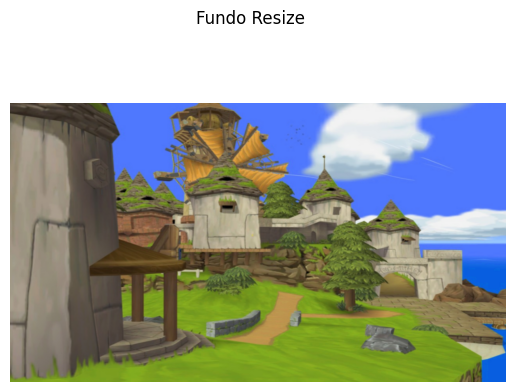

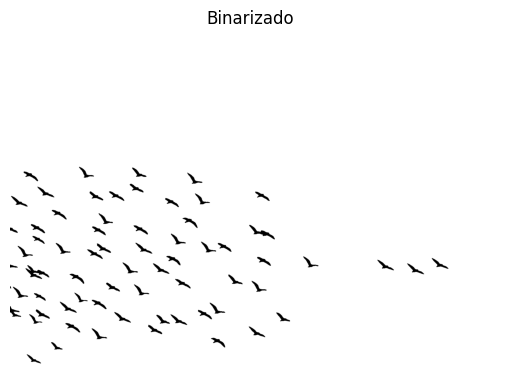

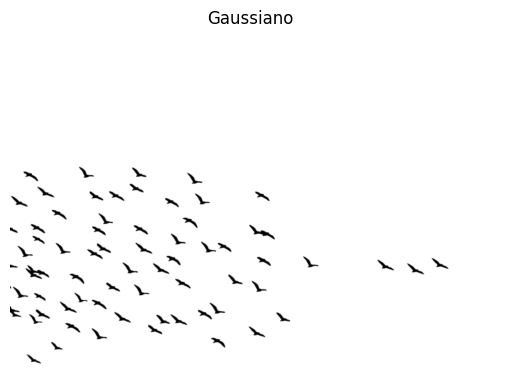

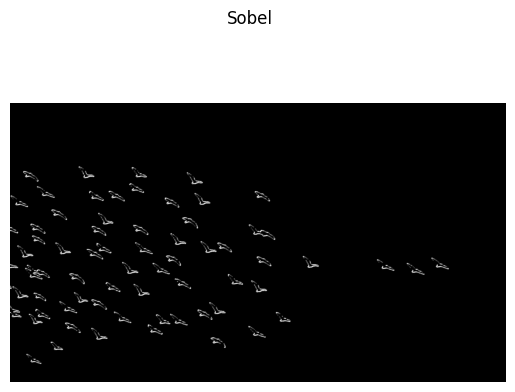

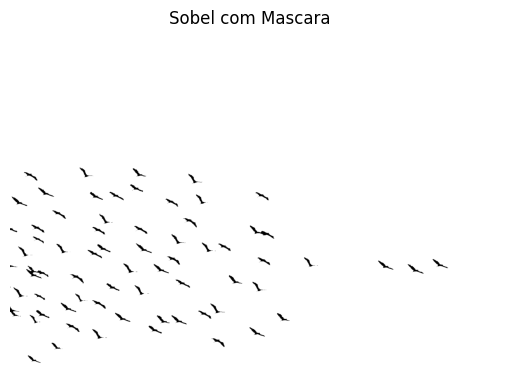

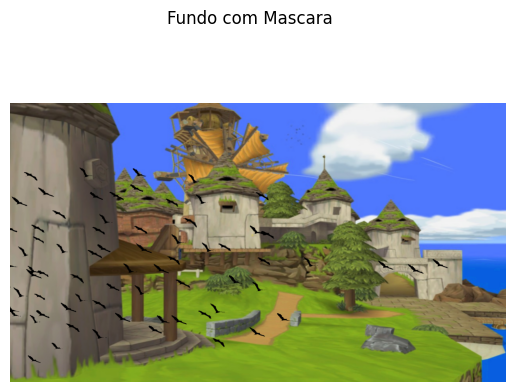

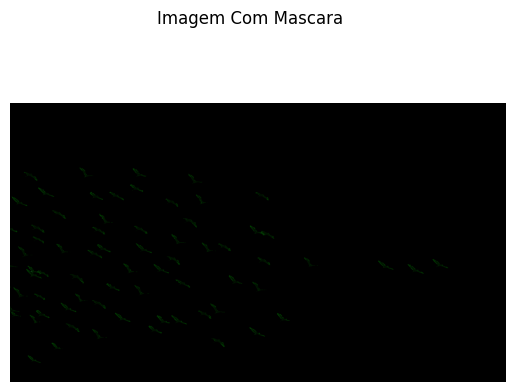

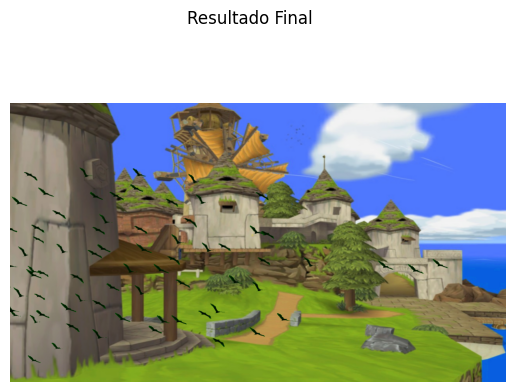

Aplicando para imagem corvos


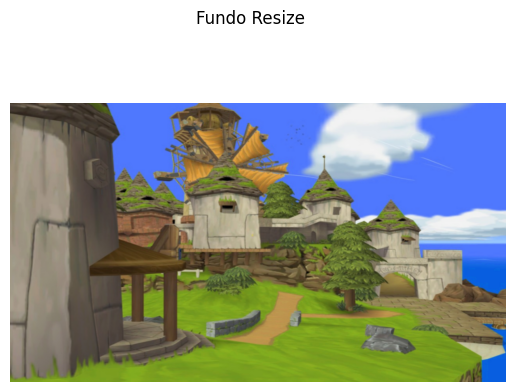

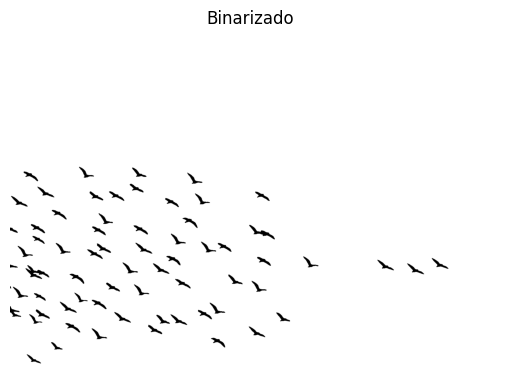

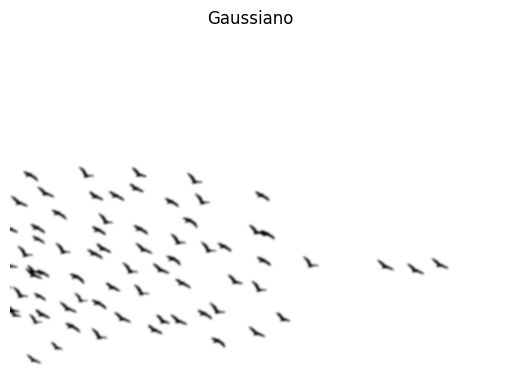

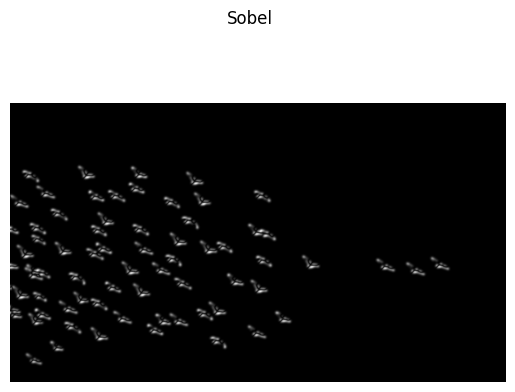

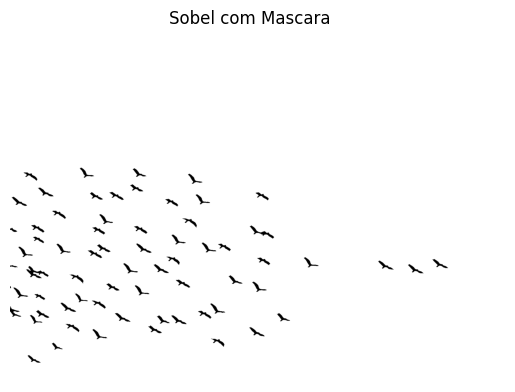

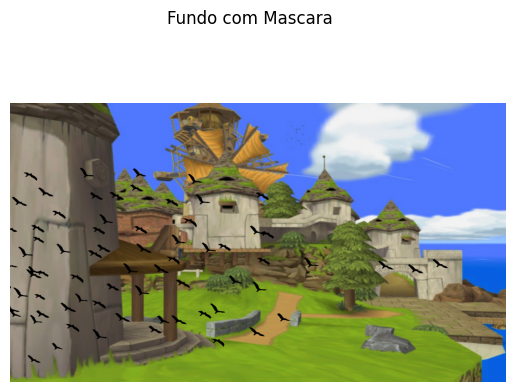

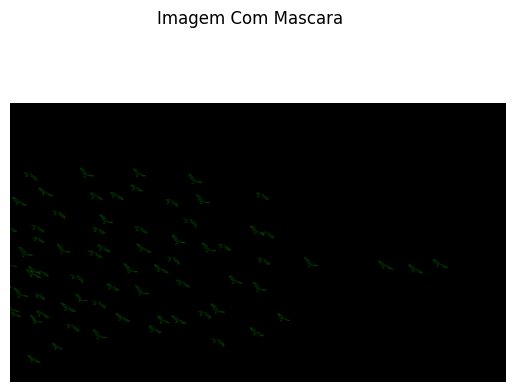

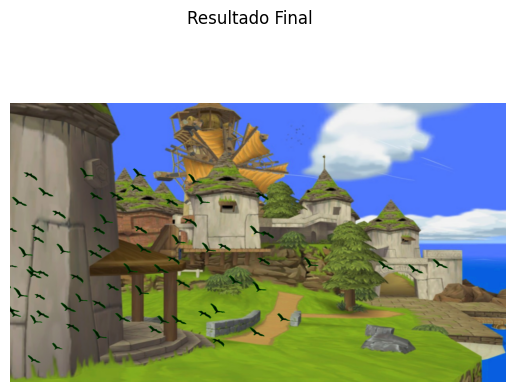

Aplicando para imagem corvos


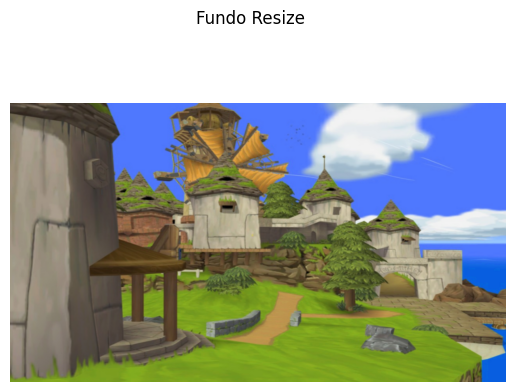

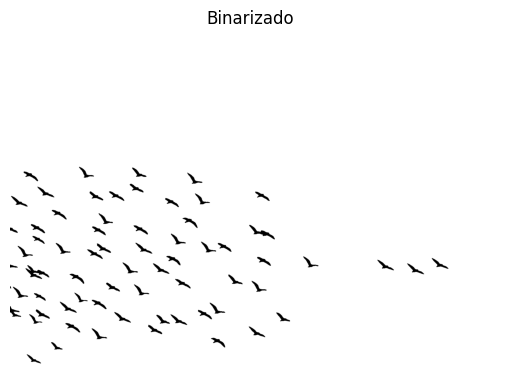

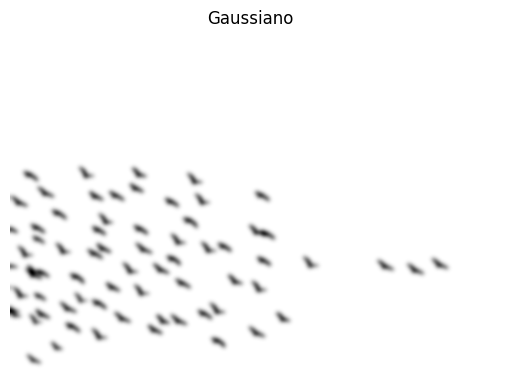

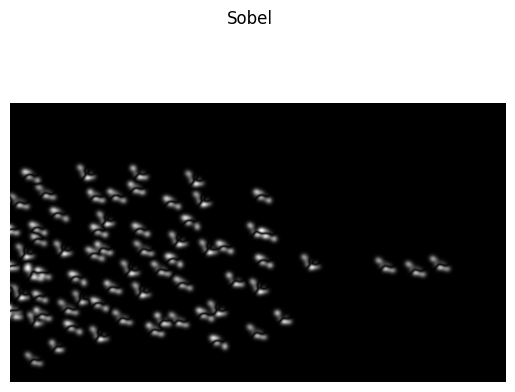

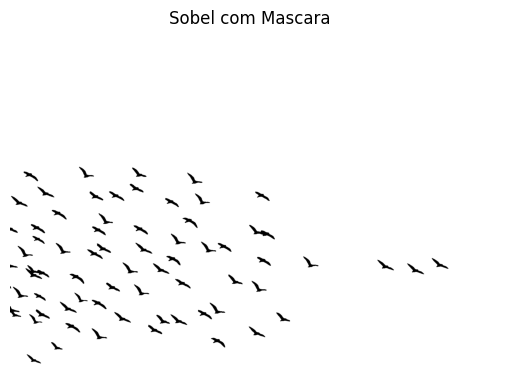

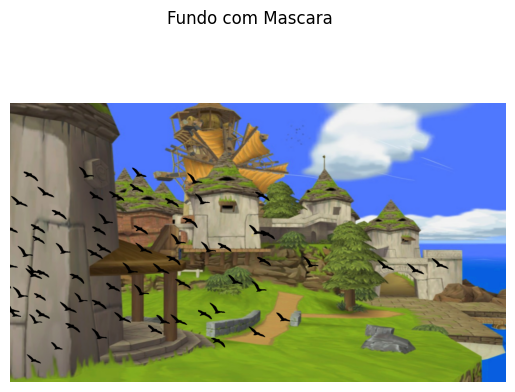

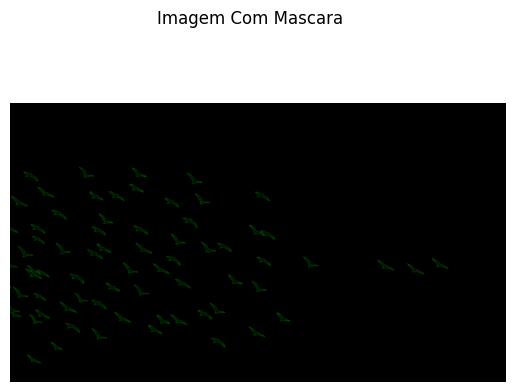

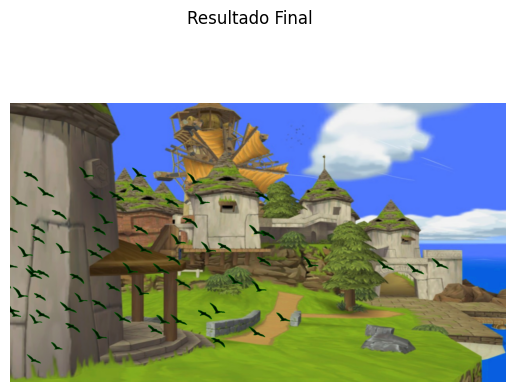

In [85]:
#Aplicando Chroma Key nos Corvos
img_corvos = cv2.imread(caminho + '/corvos.bmp')

gerar_img_chroma_key(img_corvos, img_fundo, 5, 5, 2, 2, 0.2, 0, 0, caminho_trabalho + "/Resultados/01-Corvos", resultado + '/01-Corvos', 'corvos')
gerar_img_chroma_key(img_corvos, img_fundo, 25, 25, 10, 10, 0.2, 0, 0, caminho_trabalho + "/Resultados/02-Corvos", resultado + '/02-Corvos', 'corvos')
gerar_img_chroma_key(img_corvos, img_fundo, 55, 55, 100, 100, 0.2, 0, 0, caminho_trabalho + "/Resultados/03-Corvos", resultado + '/03-Corvos', 'corvos')

Aplicando para imagem rainha


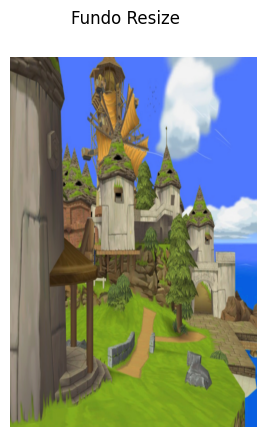

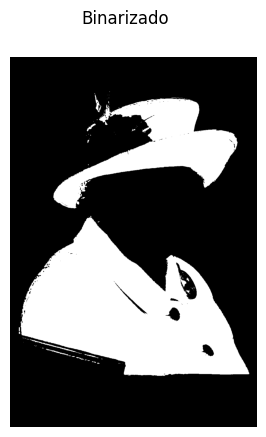

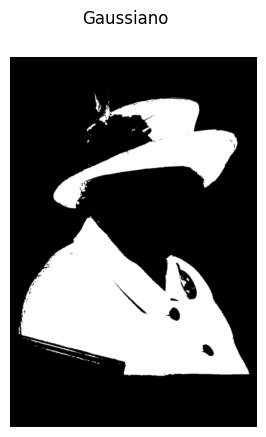

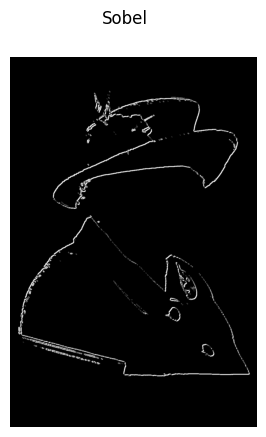

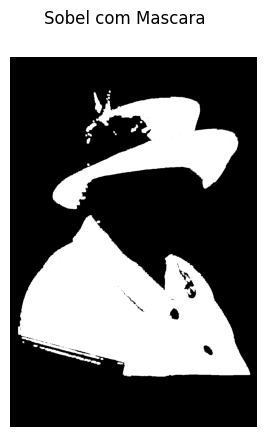

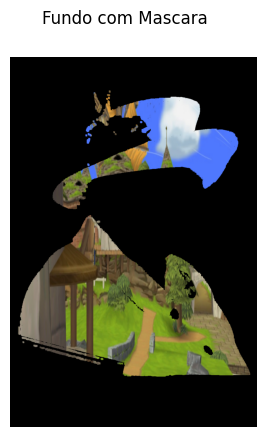

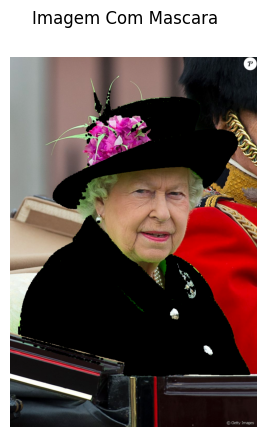

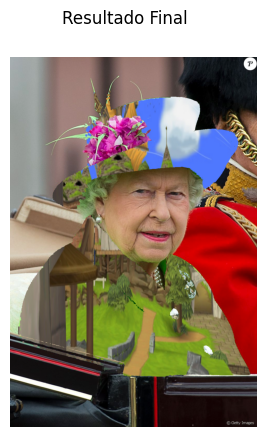

Aplicando para imagem rainha


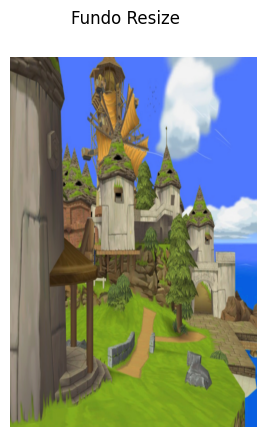

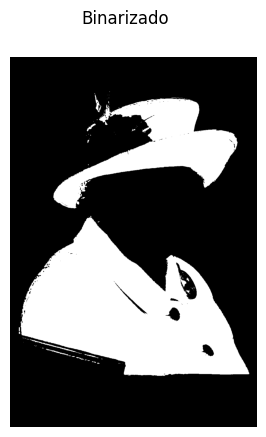

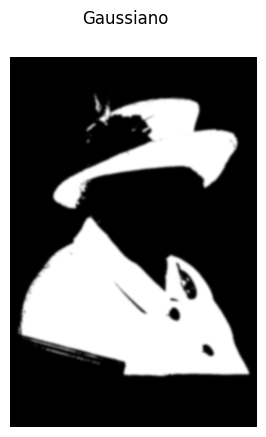

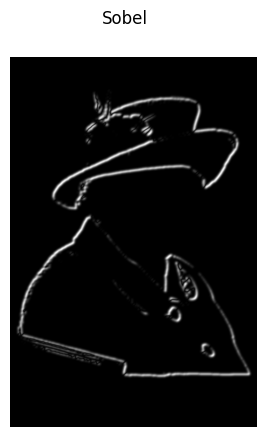

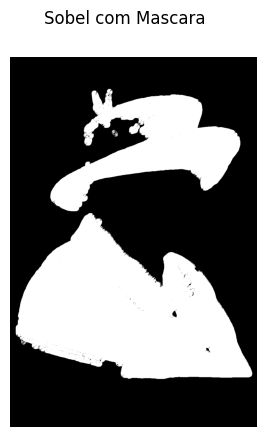

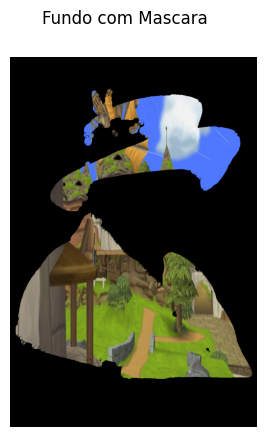

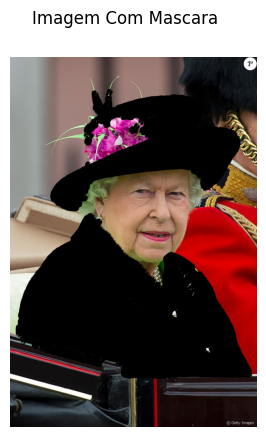

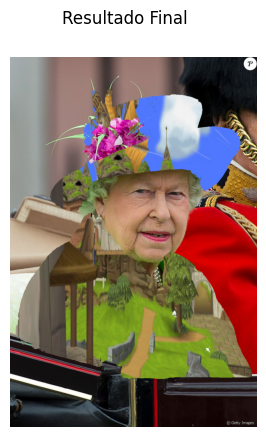

Aplicando para imagem rainha


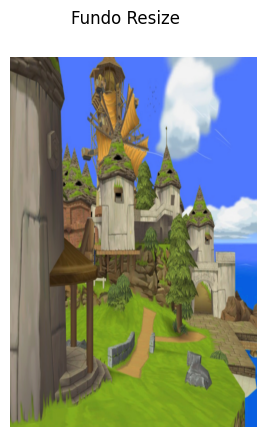

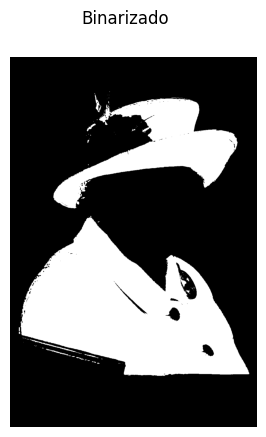

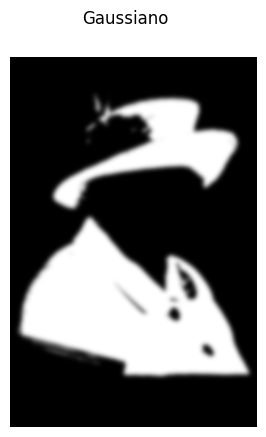

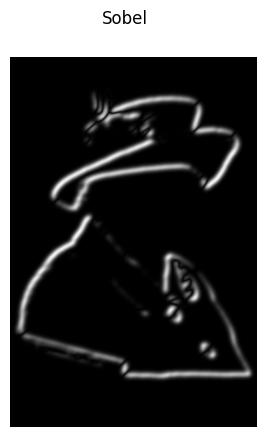

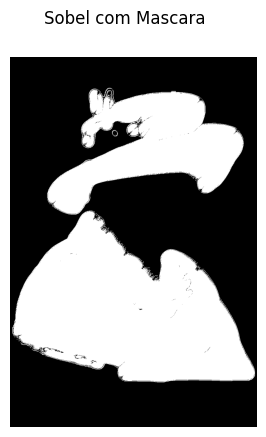

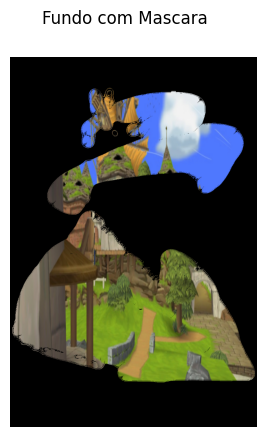

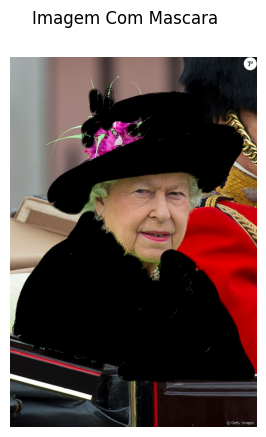

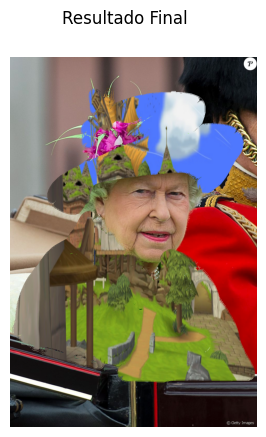

In [83]:
#Aplicando Chroma Key na Rainha
img_rainha = cv2.imread(caminho + '/rainha.bmp')

gerar_img_chroma_key(img_rainha, img_fundo, 5, 5, 2, 2, 0, 2, 2, caminho_trabalho + "/Resultados/01-Rainha", resultado + '/01-Rainha', 'rainha')
gerar_img_chroma_key(img_rainha, img_fundo, 25, 25, 10, 10, 0, 1, 5, caminho_trabalho + "/Resultados/02-Rainha", resultado + '/02-Rainha', 'rainha')
gerar_img_chroma_key(img_rainha, img_fundo, 55, 55, 100, 100, 0, 2, 2, caminho_trabalho + "/Resultados/03-Rainha", resultado + '/03-Rainha', 'rainha')

Aplicando para imagem formas


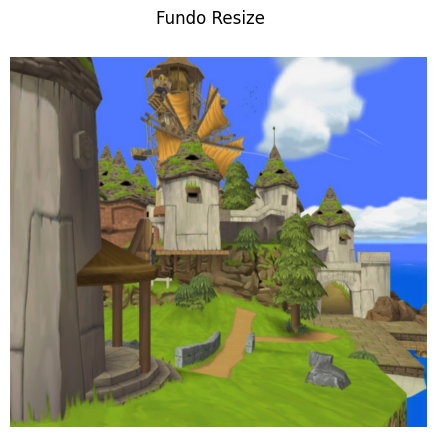

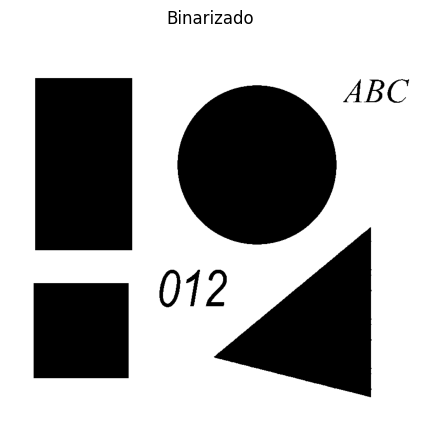

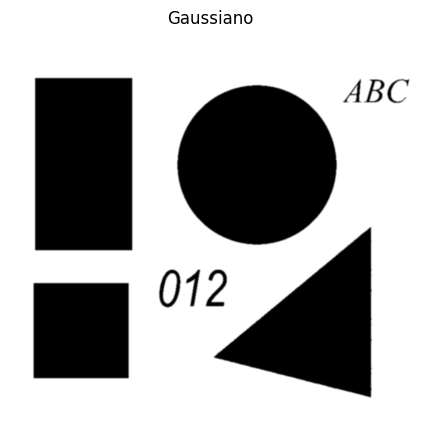

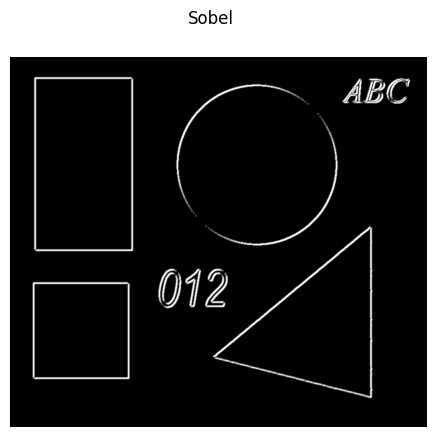

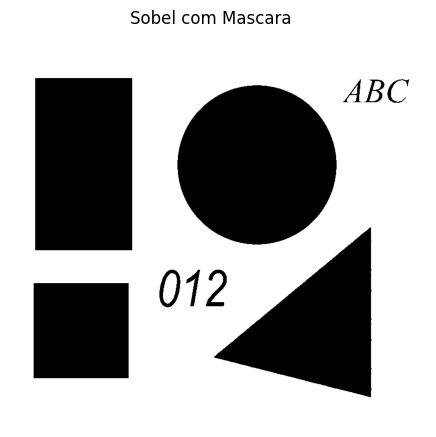

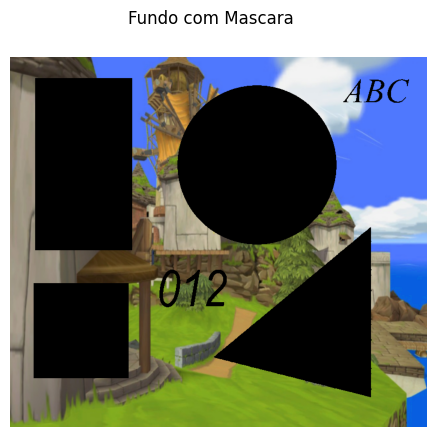

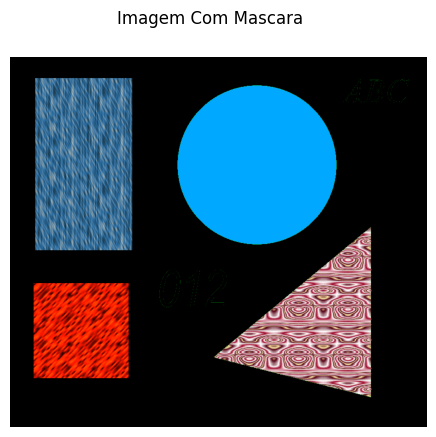

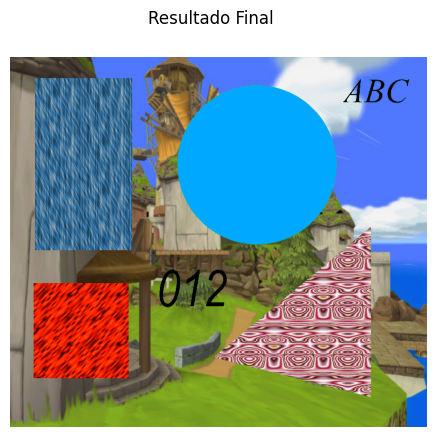

Aplicando para imagem formas


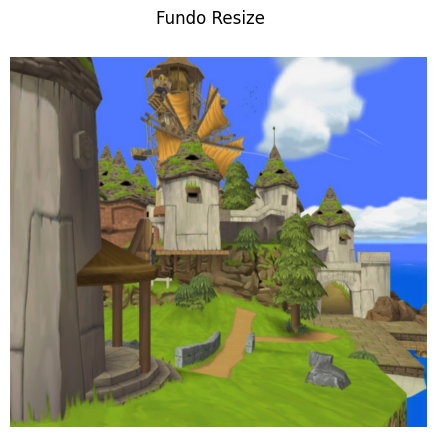

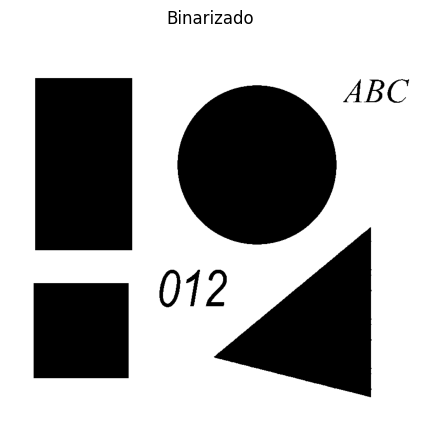

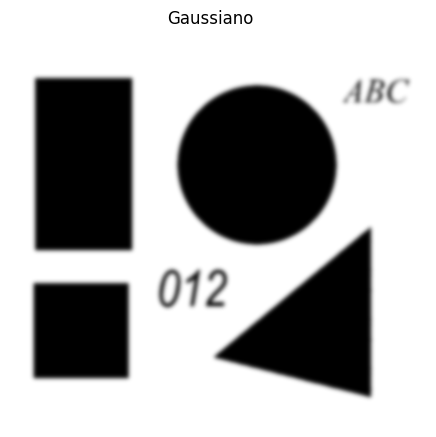

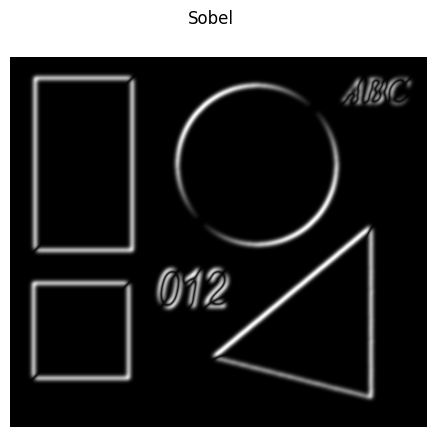

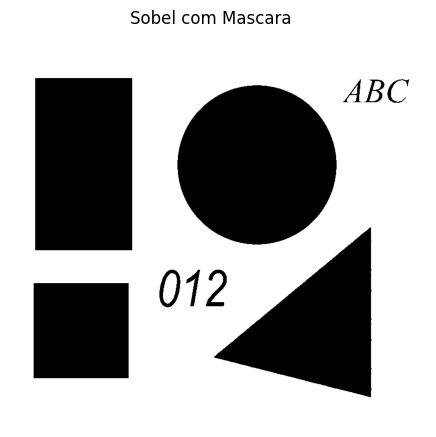

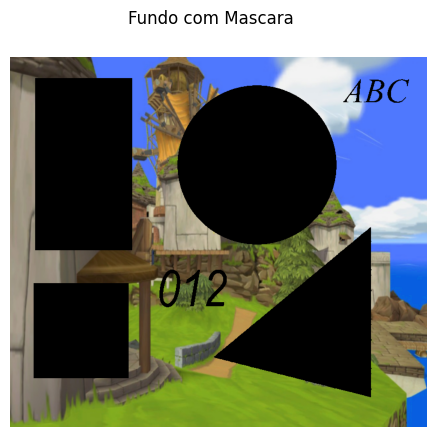

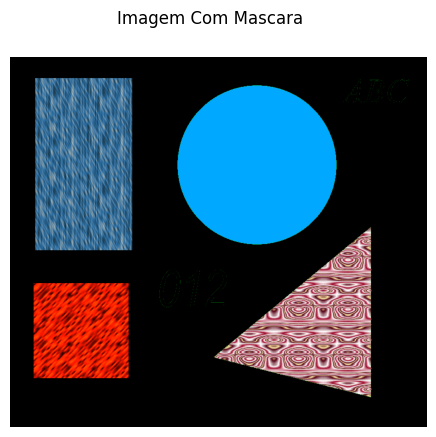

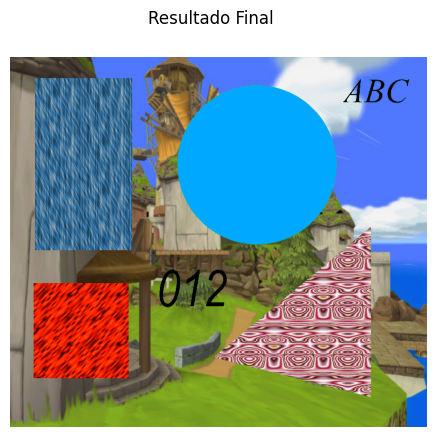

Aplicando para imagem formas


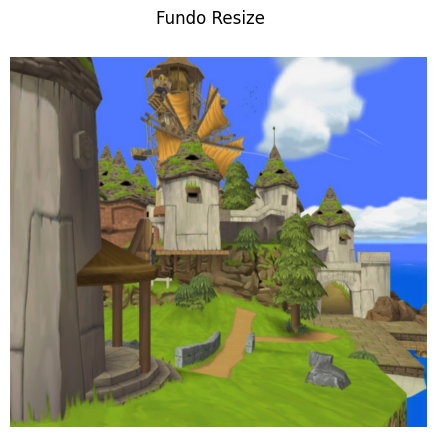

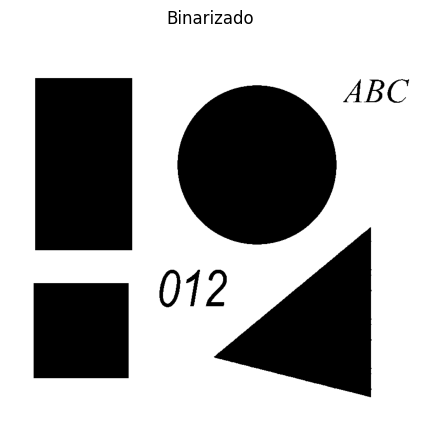

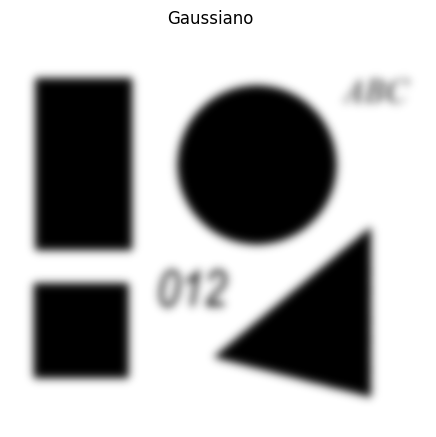

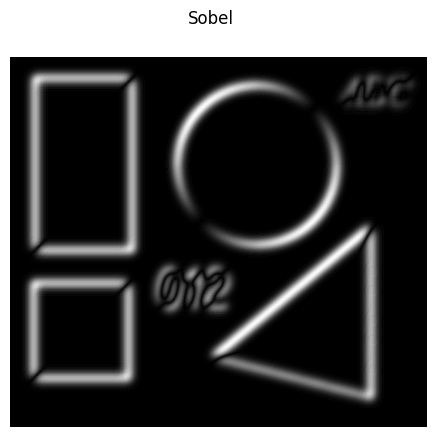

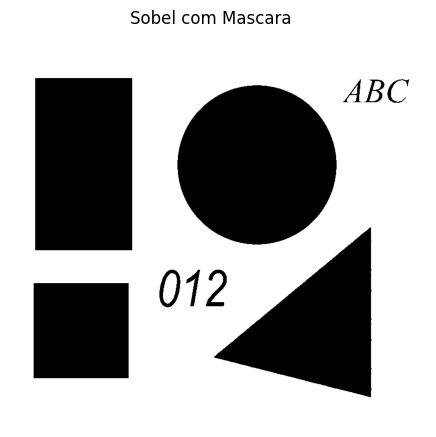

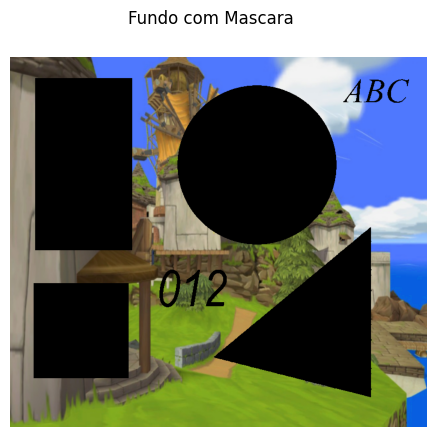

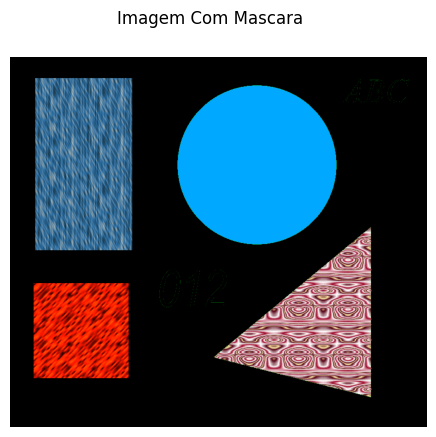

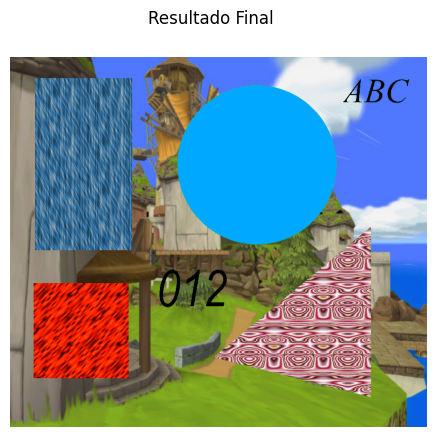

In [84]:
#Aplicando Chroma Key nas Formas
img_formas = cv2.imread(caminho + '/formas.bmp')

gerar_img_chroma_key(img_formas, img_fundo, 5, 5, 2, 2, 1, 0, 0, caminho_trabalho + "/Resultados/01-Formas", resultado + '/01-Formas', 'formas')
gerar_img_chroma_key(img_formas, img_fundo, 25, 25, 10, 10, 1, 0, 0, caminho_trabalho + "/Resultados/02-Formas", resultado + '/02-Formas', 'formas')
gerar_img_chroma_key(img_formas, img_fundo, 55, 55, 100, 100, 1, 0, 0, caminho_trabalho + "/Resultados/03-Formas", resultado + '/03-Formas', 'formas')